# k-Means Clustering

In [1]:
import pandas as pd
import numpy as np
import gc
from ast import literal_eval
import copy
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, HashingVectorizer
from wordcloud import WordCloud
import nltk
import umap
import plotly.express as px
import matplotlib.pyplot as plt

from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import strip_tags
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel
from gensim.matutils import cossim

In [2]:
from pandas.core.common import SettingWithCopyWarning
import warnings

warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)

# Load data

In [3]:
df_lemmas = pd.read_csv('../data/lemmas.csv')

In [5]:
df_embeddings_sentence = pd.read_csv('../data/embeddings_paraphrase-multilingual-mpnet-base-v2_128.csv')

In [6]:
df_embeddings_word = pd.read_csv('../data/embeddings_fasttext.csv')

# Select a subset of the data

In [4]:
df_sub = df_lemmas.sample(frac=1.0, random_state=42).reset_index()

In [5]:
df_sub.shape

(66428, 3)

# Merge embeddings

In [9]:
df_sub = pd.merge(df_sub, df_embeddings_word, how='left', on='book_poem_id')
df_sub.rename(columns={"embedding": "embedding_word"}, inplace=True)

In [10]:
df_sub = pd.merge(df_sub, df_embeddings_sentence, how='left', on='book_poem_id')
df_sub.rename(columns={"embedding": "embedding_sentence"}, inplace=True)

In [11]:
df_sub['embedding_sentence'] = df_sub['embedding_sentence'].apply(lambda x: literal_eval(str(x)))

In [12]:
df_sub['embedding_word'] = df_sub['embedding_word'].apply(lambda x: literal_eval(str(x)))

In [13]:
df_sub.shape

(6643, 5)

# Filter the data

In [6]:
stopwords = ['mít', 'jít', 'být', 'dát', 'moci']

In [7]:
%%time

lemmas_filtered_column = []

# extract lemmas with N, A or V POS tag
for index, poem in df_sub.iterrows():
    if index % 1000 == 0:
        print(index, end=' ')
    
    lemmas_filtered_poem = []
    lemmas_poem = literal_eval(poem['lemmas'])
    for lemma_pos in lemmas_poem:
        lemma, pos = lemma_pos
        if pos in ['N', 'A', 'V'] and lemma not in stopwords:
            lemmas_filtered_poem.append(lemma)
    lemmas_filtered_column.append(lemmas_filtered_poem)

0 1000 2000 3000 4000 5000 6000 7000 8000 9000 10000 11000 12000 13000 14000 15000 16000 17000 18000 19000 20000 21000 22000 23000 24000 25000 26000 27000 28000 29000 30000 31000 32000 33000 34000 35000 36000 37000 38000 39000 40000 41000 42000 43000 44000 45000 46000 47000 48000 49000 50000 51000 52000 53000 54000 55000 56000 57000 58000 59000 60000 61000 62000 63000 64000 65000 66000 CPU times: user 1min 44s, sys: 1.76 s, total: 1min 46s
Wall time: 1min 46s


In [8]:
df_sub['lemmas_filtered'] = lemmas_filtered_column

# Create the dictionary

In [9]:
min_frequency = 20

In [10]:
dictionary = Dictionary(df_sub['lemmas_filtered'])

In [11]:
# Filter out words
dictionary.filter_extremes(no_below=min_frequency)

# Vectorize the data

In [12]:
df_sub['text_preprocessed'] = df_sub['lemmas_filtered'].apply(lambda x: ' '.join(x))

## Bag of Words and TF-IDF

In [13]:
vectorizer_tfidf = TfidfVectorizer()
vectorizer_count = CountVectorizer()

vectorizer_tfidf.fit(df_sub['text_preprocessed'])
vectorizer_count.fit(df_sub['text_preprocessed'])

# Transform your text data into a matrix of token counts
encodings_tfidf = vectorizer_tfidf.transform(df_sub['text_preprocessed'])
encodings_count = vectorizer_count.transform(df_sub['text_preprocessed'])

In [22]:
embeddings_word = df_sub.embedding_word.to_list()
embeddings_sentence = df_sub.embedding_sentence.to_list()

# k-Means

In [15]:
def clustering(data, encodings, n_clusters=40):
    data_copy = copy.deepcopy(data)

    kmeans = KMeans(n_clusters=n_clusters,
                        init='k-means++',
                        n_init=5,
                        max_iter=300,
                        tol=0.0001,
                        verbose=0,
                        random_state=42,
                        copy_x=True,
                        algorithm='lloyd').fit(encodings)

    data_copy['cluster'] = kmeans.labels_

    return data_copy

In [16]:
%%time

clustered = clustering(df_sub, encodings_count, 55)

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f6bc1e249d0>
Traceback (most recent call last):
  File "/home/martin/anaconda3/envs/itms/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/martin/anaconda3/envs/itms/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/martin/anaconda3/envs/itms/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/martin/anaconda3/envs/itms/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_m

CPU times: user 29min 34s, sys: 4.97 s, total: 29min 39s
Wall time: 8min 27s


In [17]:
clustered.head(1)

,index,book_poem_id,lemmas,lemmas_filtered,text_preprocessed,cluster
0,28373,623_0001-0004-0000-0008-0000,"[('být', 'V'), ('li', 'J'), ('v', 'R'), ('dům'...","[dům, hezký, dcera, krám, ráno, večer, panímám...",dům hezký dcera krám ráno večer panímáma krásn...,43


In [18]:
# cluster sizes
clustered.cluster.value_counts()

43    38070
33    10956
21     6500
47     3748
2      3442
9      1410
34      654
45      478
28      264
52      186
40      143
0       118
42       56
54       51
6        48
26       41
48       36
27       32
14       21
17       21
44       19
7        18
53       17
4        12
31       10
1        10
20        9
19        8
24        7
10        5
25        4
41        4
3         2
30        2
16        2
22        2
50        2
51        2
8         2
36        1
46        1
23        1
18        1
29        1
5         1
38        1
12        1
11        1
35        1
13        1
15        1
37        1
32        1
39        1
49        1
Name: cluster, dtype: int64

In [20]:
clustered.loc[28120]

index                                                                0
book_poem_id                                1_0001-0000-0000-0001-0000
lemmas               [('tvůj', 'P'), ('loď', 'N'), ('jít', 'V'), ('...
lemmas_filtered      [loď, vysoký, moře, brázda, stříbro, rej, přij...
text_preprocessed    loď vysoký moře brázda stříbro rej přijít modr...
cluster                                                             43
Name: 28120, dtype: object

In [27]:
# Prepare data
umap_data = umap.UMAP(
    n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings_sentence)
result = pd.DataFrame(umap_data, columns=['x', 'y'])

In [28]:
clustered = pd.concat([clustered.reset_index(), result], axis=1)

In [29]:
clustered.loc[:, 'cluster'] = clustered['cluster'].astype(str)

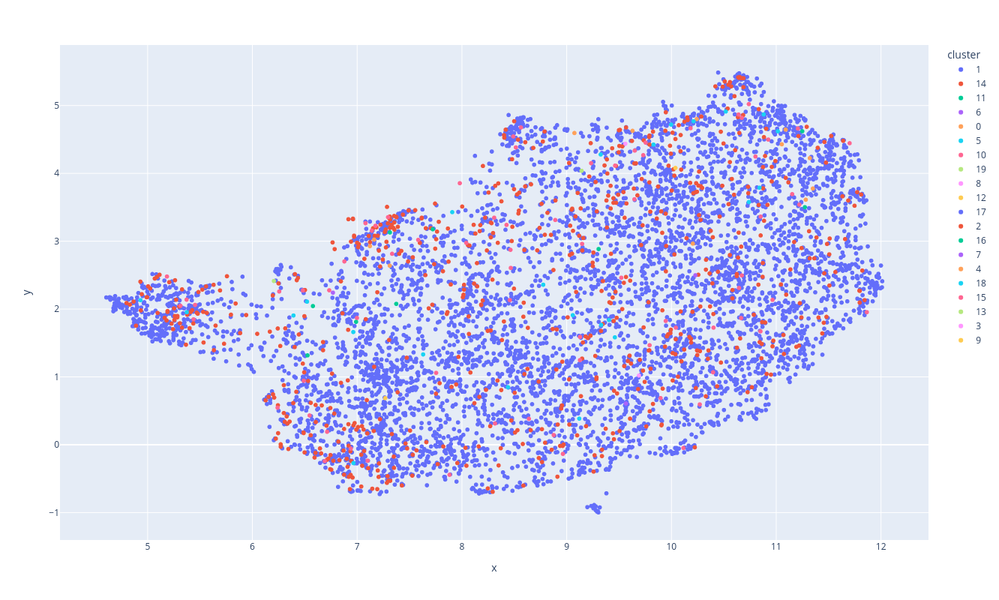

In [30]:
fig = px.scatter(clustered, x="x", y="y", color="cluster",
                 hover_data=['cluster'], width=800, height=800,
                 category_orders={'clusters': np.sort(clustered['cluster'].unique())})
fig.show()

In [31]:
clustered

,level_0,index,book_poem_id,lemmas,embedding_word,embedding_sentence,lemmas_filtered,text_preprocessed,cluster,x,y
0,0,28373,623_0001-0004-0000-0008-0000,"[('být', 'V'), ('li', 'J'), ('v', 'R'), ('dům'...","[-0.02407698519527912, -0.046690765768289566, ...","[-0.01521822065114975, 0.09372809529304504, -0...","[dům, hezký, dcera, krám, ráno, večer, panímám...",dům hezký dcera krám ráno večer panímáma krásn...,1,10.742083,0.852612
1,1,29014,638_0001-0001-0000-0167-0000,"[('z', 'R'), ('obchod', 'N'), ('nekalý', 'A'),...","[-0.03919772058725357, -0.04190506786108017, 0...","[0.09559906274080276, 0.17781420052051544, -0....","[obchod, nekalý, špinavý, vytěžit, společník, ...",obchod nekalý špinavý vytěžit společník sumičk...,1,6.985743,1.544803
2,2,13852,281_0001-0000-0000-0004-0004,"[('hle', 'I'), ('na', 'R'), ('jezero', 'N'), (...","[-0.04701334610581398, -0.11465436220169067, 0...","[-0.045002225786447525, 9.448535274714231e-05,...","[jezero, hvězdný, plující, nebesa, labuť, druž...",jezero hvězdný plující nebesa labuť družka cel...,1,10.391669,2.438566
3,3,60930,1283_0001-0000-0000-0013-0000,"[('král', 'N'), ('Louis', 'N'), ('vyjet', 'V')...","[0.007395057938992977, -0.029815051704645157, ...","[0.038963522762060165, 0.14343687891960144, -0...","[král, Louis, vyjet, lov, družina, oj, pokřik,...",král Louis vyjet lov družina oj pokřik malý zn...,1,7.964839,3.432190
4,4,19382,395_0001-0004-0000-0009-0000,"[('blíž', 'R'), ('cesta', 'N'), ('za', 'R'), (...","[-0.016261035576462746, -0.04045683890581131, ...","[-0.013938155956566334, 0.08092764019966125, -...","[cesta, město, vůz, loutkářův, stát, známý, pr...",cesta město vůz loutkářův stát známý prkno div...,1,9.282481,3.764508
...,...,...,...,...,...,...,...,...,...,...,...
6638,6638,38639,858_0001-0010-0000-0048-0000,"[('o', 'R'), ('láska', 'N'), ('bdít', 'V'), ('...","[-0.014675396494567394, -0.054399631917476654,...","[0.08714263141155243, 0.019079646095633507, -0...","[láska, bdít, svět, přetvořovat, čekat, láska,...",láska bdít svět přetvořovat čekat láska svádět...,1,10.069979,-0.057126
6639,6639,40508,890_0004-0000-0000-0059-0000,"[('kdys', 'D'), ('být', 'V'), ('Honza', 'N'), ...","[-0.02202596887946129, -0.043407902121543884, ...","[0.010627512820065022, 0.004401429556310177, -...","[Honza, král, kralovat, sedlák, stůl, hrudka, ...",Honza král kralovat sedlák stůl hrudka malovat...,1,7.054591,2.666793
6640,6640,58529,1207_0001-0000-0000-0025-0000,"[('bela', 'N'), ('ten', 'P'), ('právě', 'D'), ...","[-0.003192144213244319, -0.02564329095184803, ...","[0.04033197462558746, 0.039500873535871506, -0...","[bela, žeň, Prajza, hnát, potok, seno, bel, dr...",bela žeň Prajza hnát potok seno bel drak dělat...,1,7.170773,2.637281
6641,6641,31117,692_0002-0002-0011-0003-0000,"[('jen', 'T'), ('vnitřní', 'A'), ('život', 'N'...","[0.005685643758624792, -0.03828267380595207, 0...","[-0.07743953168392181, 0.2465551793575287, -0....","[vnitřní, život, svatý, klid, spor, obrovský, ...",vnitřní život svatý klid spor obrovský vyrůsta...,1,8.592894,-0.250016


# Extract topics

code for c-TF-IDF from: https://towardsdatascience.com/topic-modeling-with-bert-779f7db187e6

In [21]:
def c_tf_idf(documents, m, ngram_range=(1, 1)):    
    count = CountVectorizer(ngram_range=ngram_range, stop_words="english").fit(documents)
    t = count.transform(documents).toarray()
    w = t.sum(axis=1)
    tf = np.divide(t.T, w)
    sum_t = t.sum(axis=0)
    idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
    tf_idf = np.multiply(tf, idf)
    
    return tf_idf, count


def extract_top_n_words_per_cluster(tf_idf, count, docs_per_cluster, n=20):
    words = count.get_feature_names_out()
    labels = list(docs_per_cluster.cluster)
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words


def extract_topic_sizes(df):
    topic_sizes = (df.groupby(['cluster'])
                     .preprocessed_text
                     .count()
                     .reset_index()
                     .rename({"preprocessed_text": "size"}, axis='columns')
                     .sort_values("size", ascending=False))
    return topic_sizes

In [22]:
import pandas as pd
from collections import Counter

# create word frequency count
word_counts = Counter(word for row in df_sub['lemmas_filtered'] for word in row)

# filter lists based on word frequency count
df_sub['lemmas_filtered_a'] = df_sub['lemmas_filtered'].apply(lambda x: [word for word in x if word_counts[word] >= 20])

In [24]:
clustered['preprocessed_text'] = df_sub['lemmas_filtered_a'].apply(lambda x: ' '.join(x))

In [25]:
clustered.head()

,index,book_poem_id,lemmas,lemmas_filtered,text_preprocessed,cluster,preprocessed_text
0,28373,623_0001-0004-0000-0008-0000,"[('být', 'V'), ('li', 'J'), ('v', 'R'), ('dům'...","[dům, hezký, dcera, krám, ráno, večer, panímám...",dům hezký dcera krám ráno večer panímáma krásn...,43,dům hezký dcera krám ráno večer panímáma krásn...
1,29014,638_0001-0001-0000-0167-0000,"[('z', 'R'), ('obchod', 'N'), ('nekalý', 'A'),...","[obchod, nekalý, špinavý, vytěžit, společník, ...",obchod nekalý špinavý vytěžit společník sumičk...,43,obchod nekalý špinavý společník rozdělit pravd...
2,13852,281_0001-0000-0000-0004-0004,"[('hle', 'I'), ('na', 'R'), ('jezero', 'N'), (...","[jezero, hvězdný, plující, nebesa, labuť, druž...",jezero hvězdný plující nebesa labuť družka cel...,21,jezero hvězdný plující nebesa labuť družka cel...
3,60930,1283_0001-0000-0000-0013-0000,"[('král', 'N'), ('Louis', 'N'), ('vyjet', 'V')...","[král, Louis, vyjet, lov, družina, oj, pokřik,...",král Louis vyjet lov družina oj pokřik malý zn...,33,král Louis vyjet lov družina oj pokřik malý zn...
4,19382,395_0001-0004-0000-0009-0000,"[('blíž', 'R'), ('cesta', 'N'), ('za', 'R'), (...","[cesta, město, vůz, loutkářův, stát, známý, pr...",cesta město vůz loutkářův stát známý prkno div...,43,cesta město vůz stát známý prkno divadlo truch...


# c-TF-IDF

In [26]:
# merge documents in cluster into one document
docs_per_cluster = clustered.groupby(['cluster'], as_index = False).agg({'preprocessed_text': ' '.join})

In [27]:
docs_per_cluster

,cluster,preprocessed_text
0,0,bitva praporec meč bok viset den okno chrám km...
1,1,čnít rozbořený hrad dol shlížet plíseň stín ch...
2,2,den krásný Helios pohled teplý probouzet strom...
3,3,víska tichý dřímat věnec pahorek pastýř ovce d...
4,4,Aj hora hora strmý hedvábný tráva porostlý hor...
5,5,trůnit glorie slunný výšina větrový dout dech ...
6,6,dvůr vypadat strana host hnát množství barevný...
7,7,mysl cena uznávat ztráta potkat nenadálý krutý...
8,8,moře hučet tmavý vlna bít břeh šírý hrobový pí...
9,9,stůl psát lokat plný prs ranní vzduch sílící s...


In [28]:
tf_idf, count = c_tf_idf(docs_per_cluster.preprocessed_text.values, m=len(df_sub))

In [29]:
top_n_words = extract_top_n_words_per_cluster(tf_idf, count, docs_per_cluster, n=10)

In [30]:
top_n_words

{0: [('země', 0.007369985798047523),
  ('lid', 0.005506527713450886),
  ('duch', 0.005352753727862164),
  ('bratr', 0.005307271279883421),
  ('nebe', 0.005245944435901278),
  ('síla', 0.00519260989979049),
  ('krev', 0.005044275218460287),
  ('moře', 0.005032042009328104),
  ('bůh', 0.005019596186887152),
  ('svatý', 0.00499799130092375)],
 1: [('dítě', 0.013106728519648845),
  ('hlas', 0.011746684780636063),
  ('tajnost', 0.011157447535810612),
  ('špaček', 0.010997633025515426),
  ('zbádat', 0.010576985244720668),
  ('škola', 0.010476125756128985),
  ('živý', 0.010412090328420038),
  ('krista', 0.010352939175134968),
  ('chtít', 0.009767351493380417),
  ('slyšet', 0.009442662857324603)],
 2: [('chtít', 0.020021472384326826),
  ('vědět', 0.0064284198463193205),
  ('muset', 0.006132273995500208),
  ('rád', 0.005759066840631765),
  ('říci', 0.005628095342731024),
  ('žít', 0.005371732516754155),
  ('člověk', 0.005201237543983531),
  ('znát', 0.004875352618085718),
  ('pán', 0.0048727943

In [31]:
topic_sizes = extract_topic_sizes(clustered)
topic_sizes.sort_values(by='cluster')

,cluster,size
0,0,118
1,1,10
2,2,3442
3,3,2
4,4,12
5,5,1
6,6,48
7,7,18
8,8,2
9,9,1410


In [32]:
top_n_words[43]

[('člověk', 0.004255315001428541),
 ('rád', 0.004246906529558983),
 ('nebe', 0.004176388119427271),
 ('vědět', 0.004119941563932994),
 ('svět', 0.004080625026970693),
 ('čas', 0.004020247284851411),
 ('píseň', 0.003979150202377221),
 ('život', 0.00396463912394953),
 ('rok', 0.003926382340049435),
 ('bůh', 0.003920664760420787)]

In [33]:
def word_cloud(top_n_words, topic):
    word_dict = {word: prob for word, prob in top_n_words[topic]}

    wc = WordCloud(background_color='white', width=800, height=400)
    wc.generate_from_frequencies(word_dict)

    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.show()

0


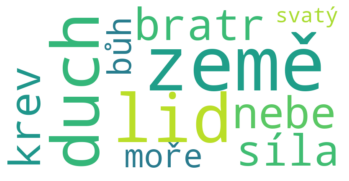

1


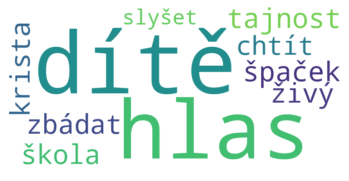

2


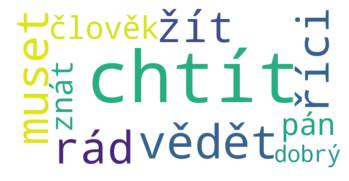

3


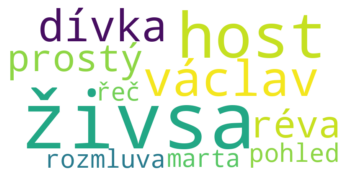

4


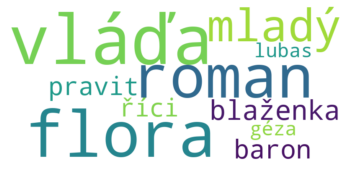

5


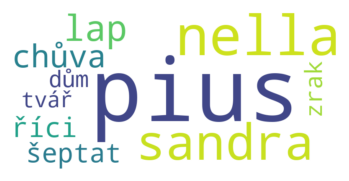

6


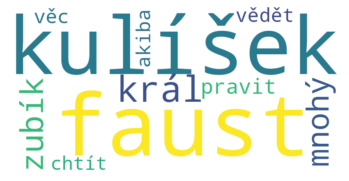

7


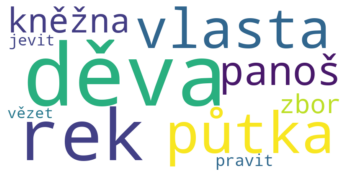

8


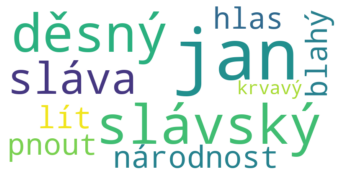

9


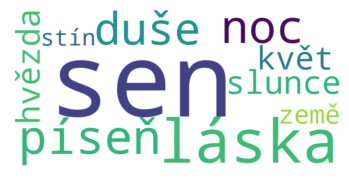

10


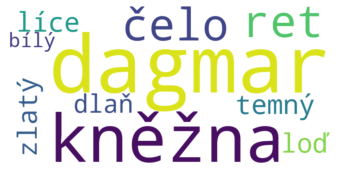

11


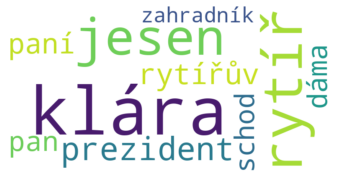

12


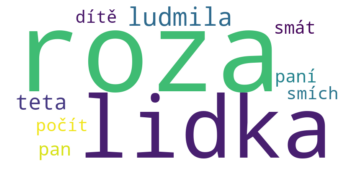

13


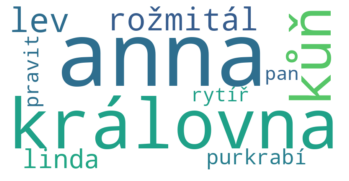

14


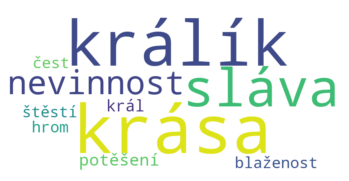

15


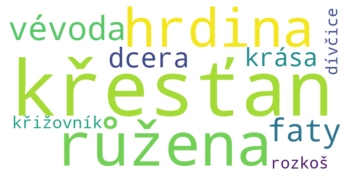

16


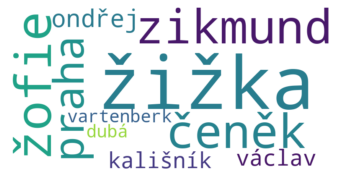

17


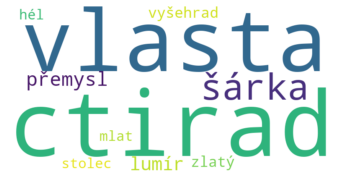

18


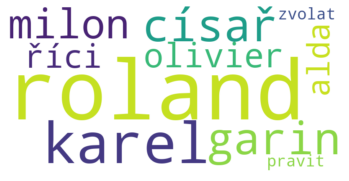

19


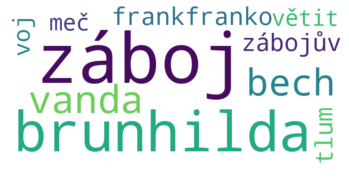

20


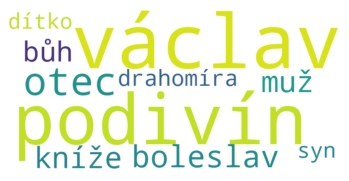

21


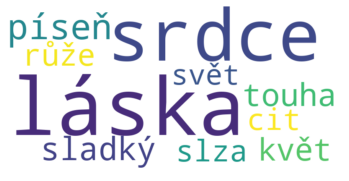

22


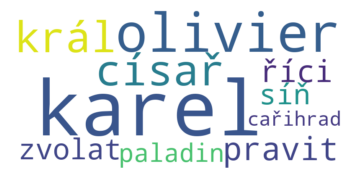

23


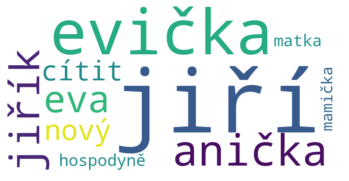

24


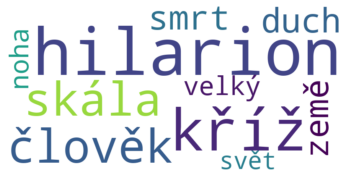

25


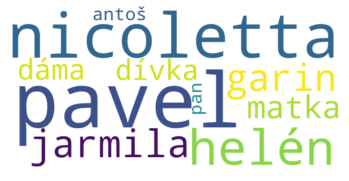

26


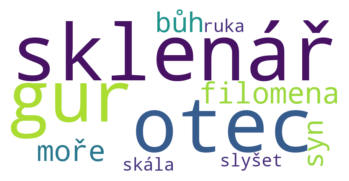

27


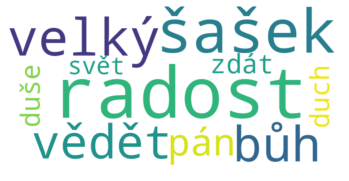

28


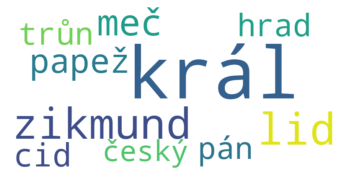

29


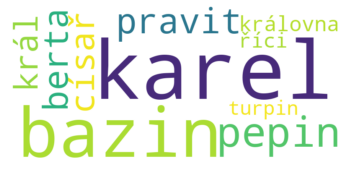

30


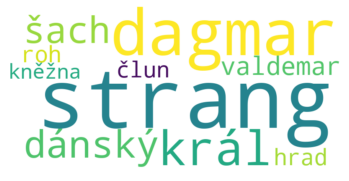

31


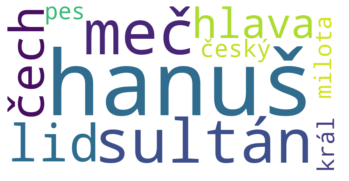

32


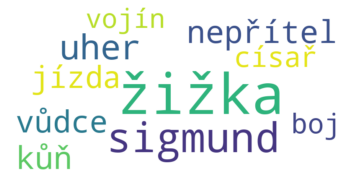

33


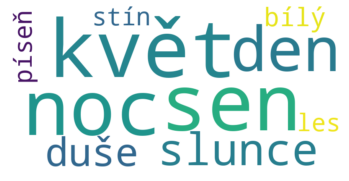

34


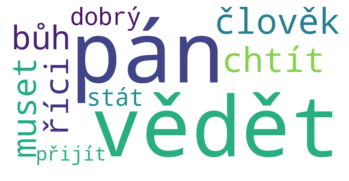

35


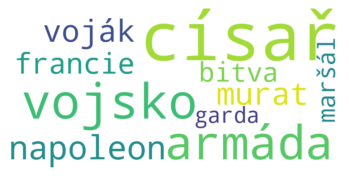

36


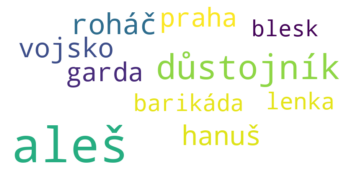

37


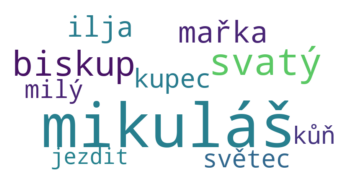

38


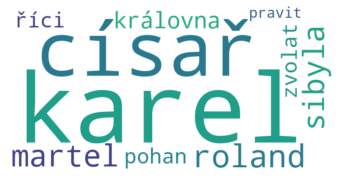

39


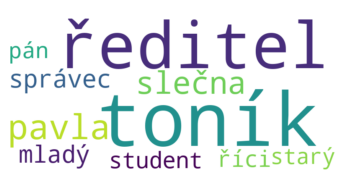

40


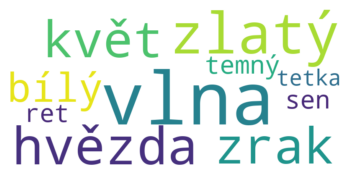

41


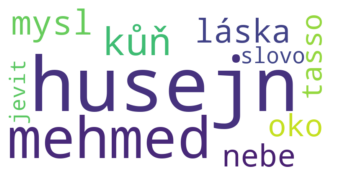

42


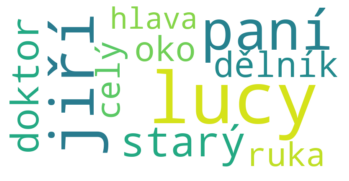

43


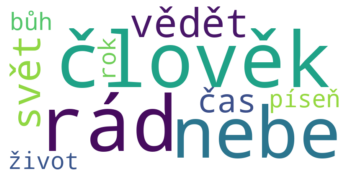

44


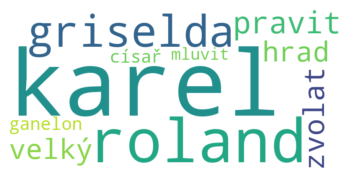

45


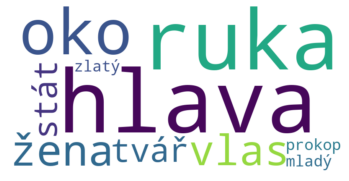

46


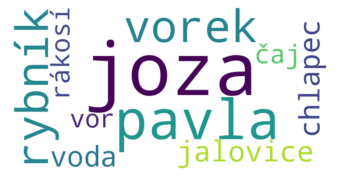

47


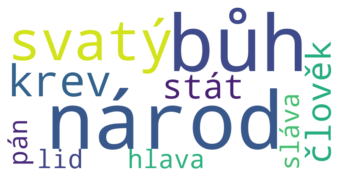

48


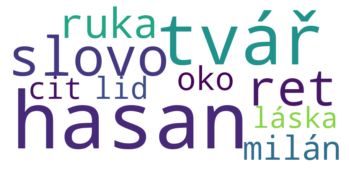

49


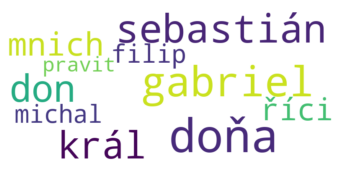

50


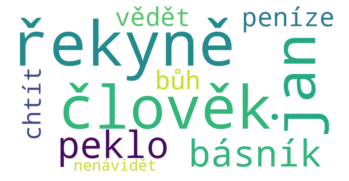

51


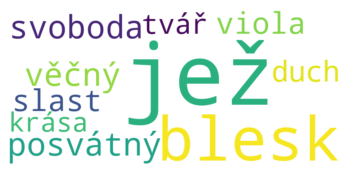

52


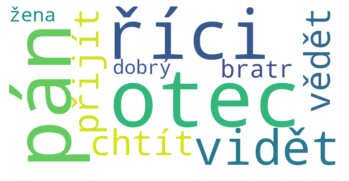

53


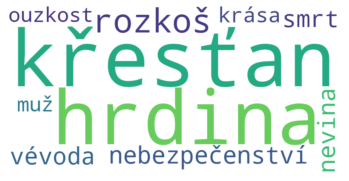

54


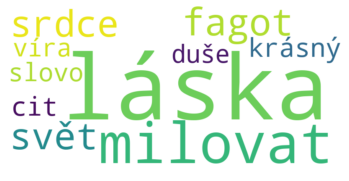

In [35]:
for i in range(len(top_n_words)):
    print(i)
    word_cloud(top_n_words, i)

In [37]:
topics = []

for i in top_n_words:
    words_topic = []
    for word in top_n_words[i]:
        words_topic.append(word[0])
    topics.append(words_topic)

In [38]:
topics[43]

['člověk',
 'rád',
 'nebe',
 'vědět',
 'svět',
 'čas',
 'píseň',
 'život',
 'rok',
 'bůh']

In [164]:
cm = CoherenceModel(topics=topics, topn=10, dictionary=dictionary, texts=df_sub['lemmas_filtered_a'], coherence='c_v')
coherence = cm.get_coherence()
coherence

0.49852912553205153

In [166]:
from utils import topic_diversity

In [168]:
topic_diversity(topics, 10)

0.645

# Load results

In [3]:
results = pd.read_csv('../results/kmeans/results_kmeans.csv')
results

,embedding_type,num_clusters,coherence,diversity,training_time
0,bow,5,0.430233,0.780000,NaN
1,bow,10,0.456653,0.710000,NaN
2,bow,15,0.481002,0.666667,NaN
3,bow,20,0.504406,0.645000,NaN
4,bow,25,0.533166,0.712000,NaN
...,...,...,...,...,...
91,embeddings_sentence,100,0.506847,0.382000,NaN
92,embeddings_sentence,105,0.503401,0.365714,NaN
93,embeddings_sentence,110,0.506763,0.391818,NaN
94,embeddings_sentence,115,0.505619,0.373913,NaN


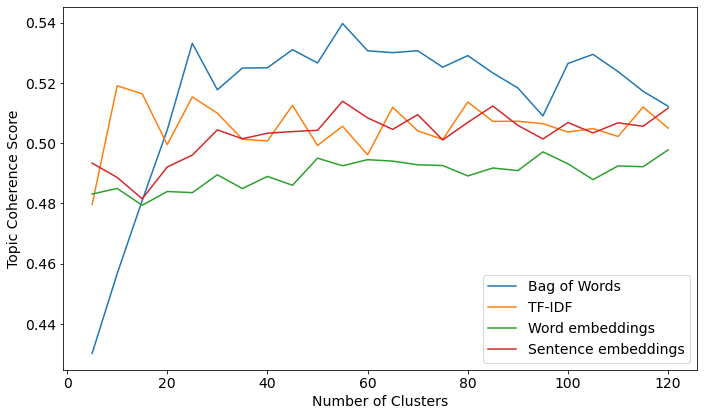

In [5]:
import matplotlib.pyplot as plt

# Set font size
plt.rcParams.update({'font.size': 14})

# Create a figure with two subplots
fig, ax1 = plt.subplots(figsize=(10, 6))
ax1.set_xlabel('Number of Clusters')
ax1.set_ylabel('Topic Coherence Score')

# separate the x and y values into two separate lists
x_values = results.loc[results['embedding_type'] == 'bow'].num_clusters

y1_values = results.loc[results['embedding_type'] == 'bow'].coherence
y2_values = results.loc[results['embedding_type'] == 'tf-idf'].coherence
y3_values = results.loc[results['embedding_type'] == 'embeddings_word'].coherence
y4_values = results.loc[results['embedding_type'] == 'embeddings_sentence'].coherence

ax1.plot(x_values, y1_values, label ='Bag of Words')
ax1.plot(x_values, y2_values, label ='TF-IDF')
ax1.plot(x_values, y3_values, label ='Word embeddings')
ax1.plot(x_values, y4_values, label ='Sentence embeddings')

fig.tight_layout()
plt.legend()
plt.savefig('kmeans_coherence.png', bbox_inches='tight', pad_inches=0, dpi=400)
plt.show()

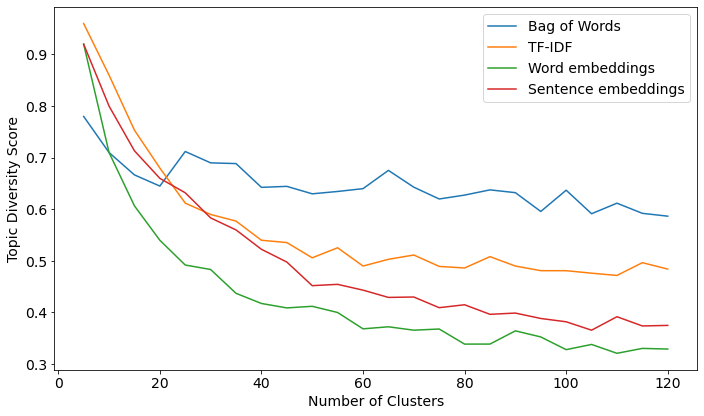

In [6]:
import matplotlib.pyplot as plt

# Set font size
plt.rcParams.update({'font.size': 14})

# Create a figure with two subplots
fig, ax1 = plt.subplots(figsize=(10, 6))
ax1.set_xlabel('Number of Clusters')
ax1.set_ylabel('Topic Diversity Score')

# separate the x and y values into two separate lists
x_values = results.loc[results['embedding_type'] == 'bow'].num_clusters

y1_values = results.loc[results['embedding_type'] == 'bow'].diversity
y2_values = results.loc[results['embedding_type'] == 'tf-idf'].diversity
y3_values = results.loc[results['embedding_type'] == 'embeddings_word'].diversity
y4_values = results.loc[results['embedding_type'] == 'embeddings_sentence'].diversity

ax1.plot(x_values, y1_values, label ='Bag of Words')
ax1.plot(x_values, y2_values, label ='TF-IDF')
ax1.plot(x_values, y3_values, label ='Word embeddings')
ax1.plot(x_values, y4_values, label ='Sentence embeddings')

fig.tight_layout()
plt.legend()
plt.savefig('kmeans_diversity.png', bbox_inches='tight', pad_inches=0, dpi=400)
plt.show()

# Revise the best model

In [39]:
clustered = pd.read_csv('../results/kmeans/kmeans_clustered.csv')

In [40]:
clustered

,book_poem_id,cluster
0,623_0001-0004-0000-0008-0000,43
1,638_0001-0001-0000-0167-0000,43
2,281_0001-0000-0000-0004-0004,21
3,1283_0001-0000-0000-0013-0000,33
4,395_0001-0004-0000-0009-0000,43
...,...,...
66423,829_0001-0002-0000-0005-0000,43
66424,133_0001-0001-0001-0019-0000,43
66425,1128_0001-0001-0000-0010-0000,43
66426,21_0001-0003-0002-0004-0000,33


In [61]:
clustered.cluster.value_counts()

43    38070
33    10956
21     6500
47     3748
2      3442
9      1410
34      654
45      478
28      264
52      186
40      143
0       118
42       56
54       51
6        48
26       41
48       36
27       32
14       21
17       21
44       19
7        18
53       17
4        12
31       10
1        10
20        9
19        8
24        7
10        5
25        4
41        4
3         2
30        2
16        2
22        2
50        2
51        2
8         2
36        1
46        1
23        1
18        1
29        1
5         1
38        1
12        1
11        1
35        1
13        1
15        1
37        1
32        1
39        1
49        1
Name: cluster, dtype: int64

In [9]:
def word_cloud(top_n_words, topic):
    word_dict = {word: prob for word, prob in top_n_words[topic]}

    wc = WordCloud(background_color='white', width=800, height=400)
    wc.generate_from_frequencies(word_dict)

    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [10]:
with open('../results/kmeans/kmeans_bow_55.txt', 'r') as f:
    topic_words = f.read()

In [11]:
topic_words = literal_eval(topic_words)

0


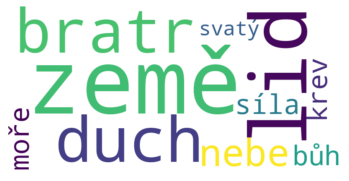

1


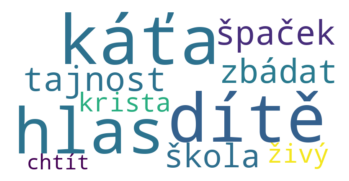

2


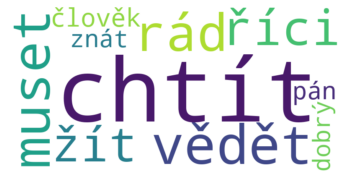

3


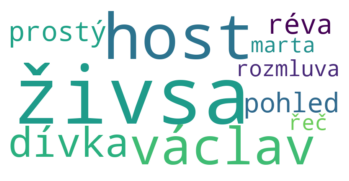

4


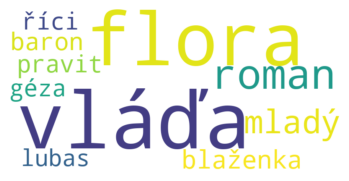

5


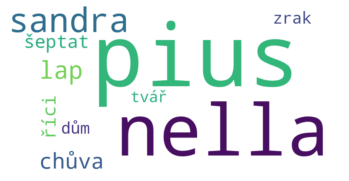

6


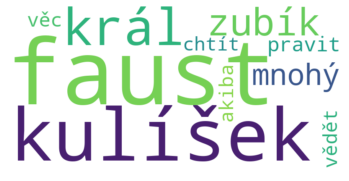

7


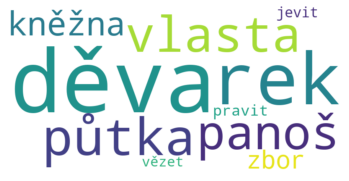

8


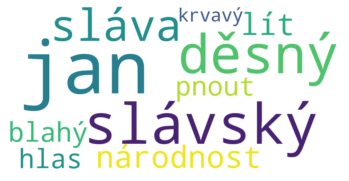

9


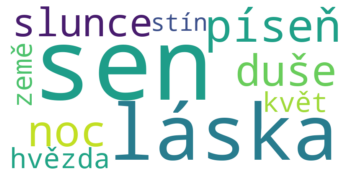

10


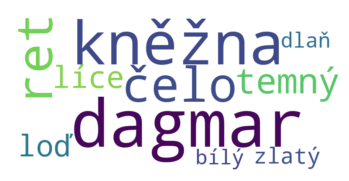

11


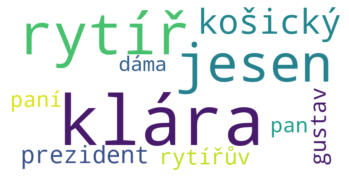

12


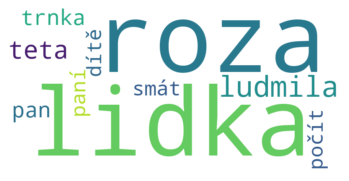

13


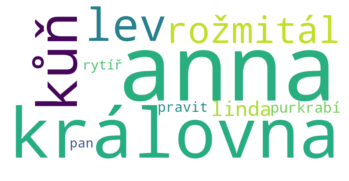

14


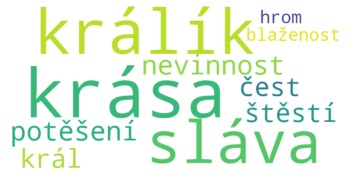

15


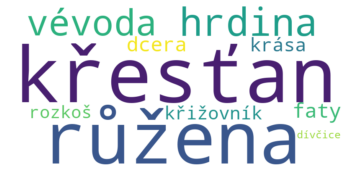

16


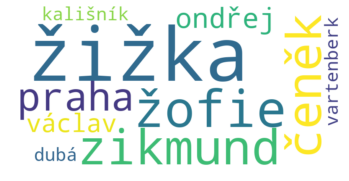

17


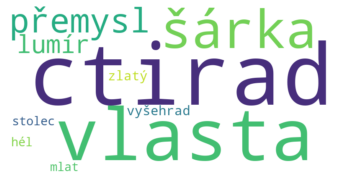

18


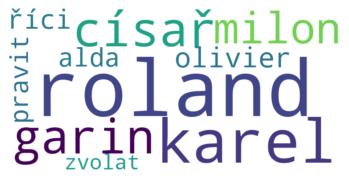

19


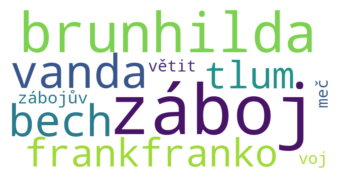

20


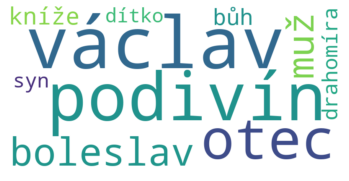

21


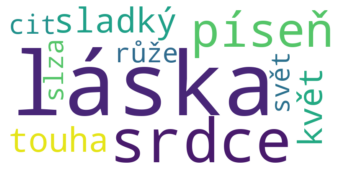

22


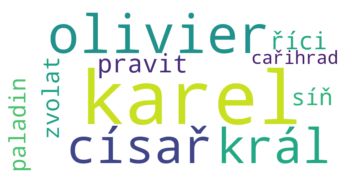

23


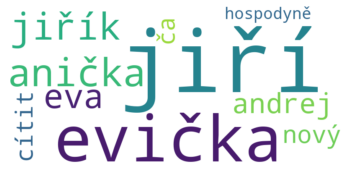

24


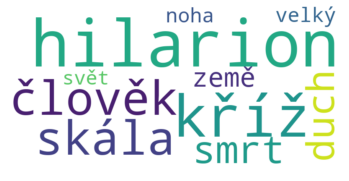

25


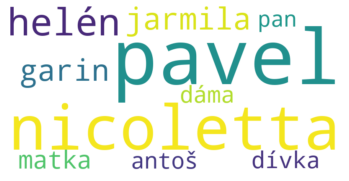

26


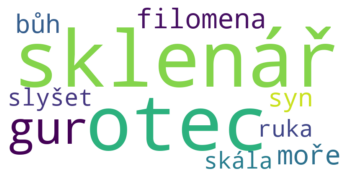

27


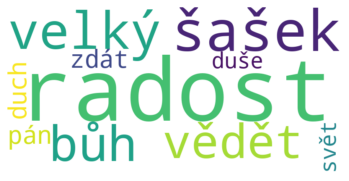

28


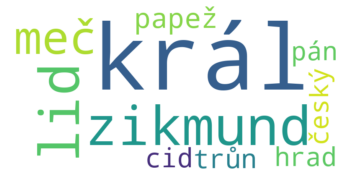

29


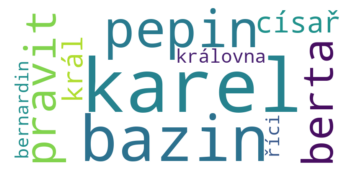

30


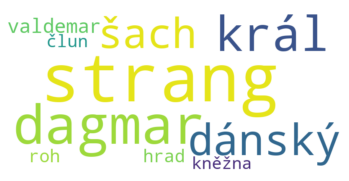

31


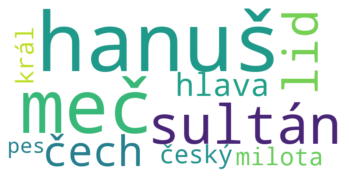

32


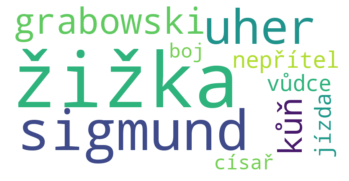

33


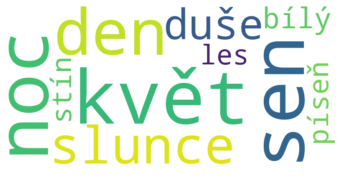

34


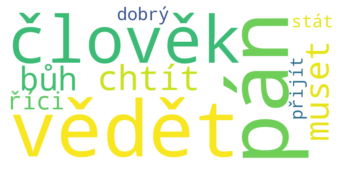

35


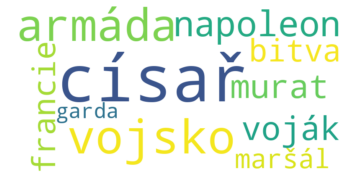

36


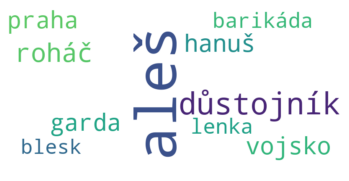

37


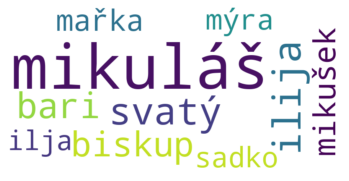

38


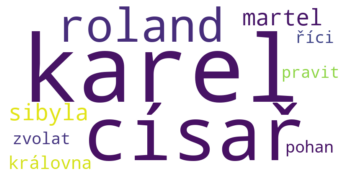

39


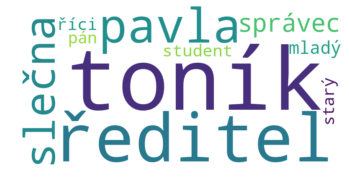

40


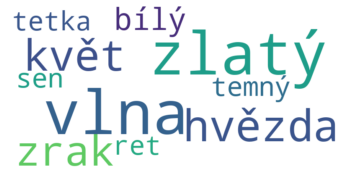

41


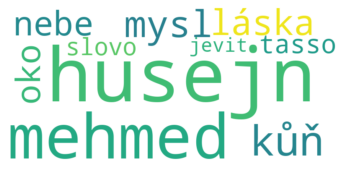

42


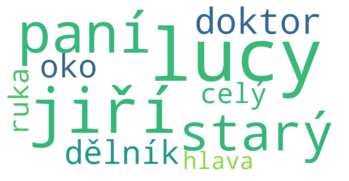

43


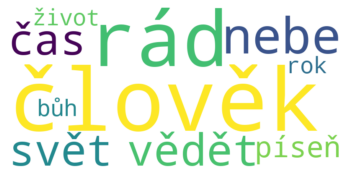

44


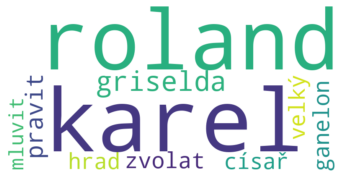

45


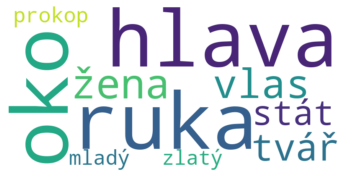

46


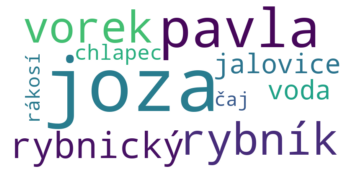

47


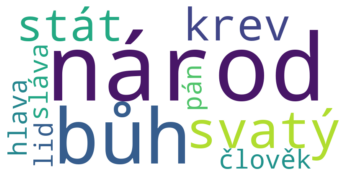

48


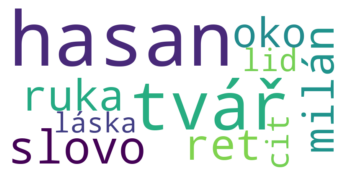

49


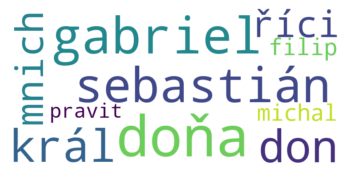

50


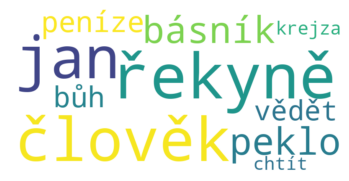

51


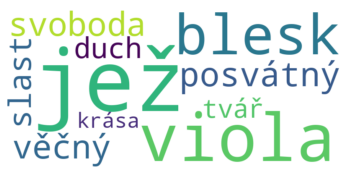

52


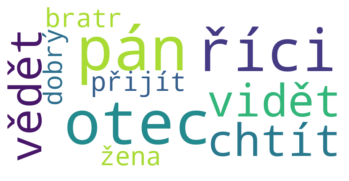

53


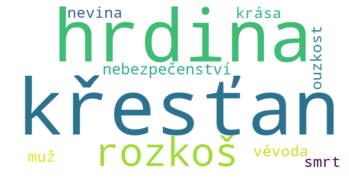

54


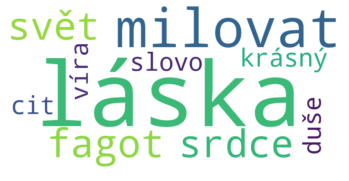

In [12]:
for i in range(len(topic_words)):
    print(i)
    word_cloud(topic_words, i)

In [13]:
def word_cloud_save(top_n_words, name):
    word_dict = {word: prob for word, prob in top_n_words}

    wc = WordCloud(background_color='white', width=1600, height=800)
    wc.generate_from_frequencies(word_dict)

    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.savefig(name, bbox_inches='tight', pad_inches=0, dpi=400)
    plt.show()

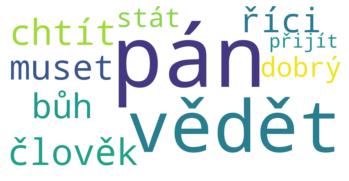

In [21]:
word_cloud_save(topic_words[34], 'kmeans_34.png')

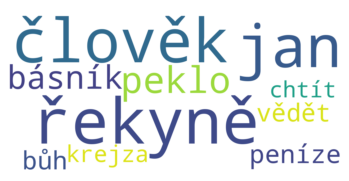

In [30]:
word_cloud_save(topic_words[50], 'kmeans_50.png')